In [1]:
import math
import gym
import numpy

import jax
from jax import grad, jit, vmap
import jax.numpy as np
from jax import random
from jax.ops import index, index_add, index_update


In [3]:
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML
%matplotlib inline


In [4]:
def f(x1, x2):
    return np.sin(2+(x1-2)*10) * np.cos(2 + (x2) * (x1-1)*7) * np.cos(x1*x2*13)

def f(x1, x2):
    x1=(x1+1)/2 * 5
    x2=(x2+1)/2 * 5
    return np.sin(x1) ** 10 + np.cos(10 + x2 * x1) * np.cos(x1)


DeviceArray(1.051042, dtype=float32)

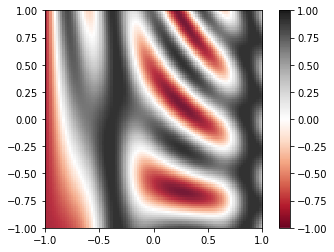

In [5]:
x1 = np.linspace(-1, 1, 100)
x2 = np.linspace(-1, 1, 100)

X1, X2 = np.meshgrid(x1,x2)
Y = f(X1, X2)

plt.imshow(Y, extent=[-1, 1, -1, 1], origin='lower',vmin=-1, vmax=1,
           cmap='RdGy', alpha=0.9)
plt.colorbar();

Y.max()

(2, 10000)

In [6]:
def alternate(N,a,b):
    i=0
    out = b
    while i<N:
        i+=1
        out = a if out==b else b
        yield out
        
def alternating_array(N,a,b):
    return numpy.array(list(alternate(N,a,b)))

def checkerboard(N,M):
    return numpy.outer(alternating_array(N,-1.0,1.0),alternating_array(M,1.0,-1.0))


checkerboard(8,4)
# numpy.outer(np.array(alternate(5,-1,1)), np.array(alternate(5,-1,1)), out=None)

array([[-1.,  1., -1.,  1.],
       [ 1., -1.,  1., -1.],
       [-1.,  1., -1.,  1.],
       [ 1., -1.,  1., -1.],
       [-1.,  1., -1.,  1.],
       [ 1., -1.,  1., -1.],
       [-1.,  1., -1.,  1.],
       [ 1., -1.,  1., -1.]])

In [7]:
def plot_prediction(predictor, params):
    x = np.linspace(-1, 1, 1000)
    y = np.linspace(-1, 1, 1000)

    X, Y = np.meshgrid(x, y)
    gridshape = X.shape
    data = np.vstack([X.ravel(),Y.ravel()])
    Z = predictor(params,data)

    plt.imshow(Z.reshape(gridshape), extent=[-1, 1, -1, 1], origin='lower',
            cmap='RdGy', alpha=0.9)
    plt.colorbar();


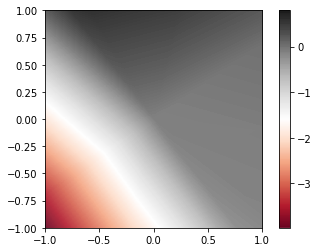

In [8]:
@jit
def relu(x):
    return np.maximum(0,x)

@jit
def normalize(x):
    return x/np.linalg.norm(x)

def random_layer_params(m, n, scale=1e-2):
    return (
        scale * numpy.random.randn(n, m),
        scale * numpy.random.randn(n,1)
    )

# Initialize all layers for a fully-connected neural network with sizes "sizes"
def init_network_params(sizes,scale=1e-2):
    return [random_layer_params(m, n, scale) for m, n in zip(sizes[:-1], sizes[1:])]

def random_layer_params_unif(m, n, scale=1e-2):
    return (
        scale * 2 * numpy.random.rand(n, m) - 1,
        scale * 2 * numpy.random.rand(n,1) -1
    )

# Initialize all layers for a fully-connected neural network with sizes "sizes"
def init_network_params_unif(sizes,scale=1):
    return [random_layer_params_unif(m, n, scale) for m, n in zip(sizes[:-1], sizes[1:])]

def init_network_params_He(sizes):
    return [(
        numpy.random.randn(n, m)*numpy.sqrt(2/m),
        numpy.zeros((n,1)) 
        # numpy.random.randn(n, 1)*numpy.sqrt(2/m)
    ) for m, n in zip(sizes[:-1], sizes[1:])]


@jit
def predict(params, x):
    # per-example predictions
    for w, b in params[:-1]:
        x = relu(np.dot(w, x) + b)
    w, b = params[-1]
    return np.dot(w, x) + b
  
params = init_network_params_He([2,10,1])

plot_prediction(predict,params)
# params
# predict(params,1)

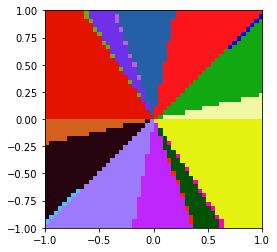

In [8]:
def surface_grads_on_grid(predict,params,n_mesh=50):
    x = np.linspace(-1, 1, n_mesh)
    y = np.linspace(-1, 1, n_mesh)

    X, Y = np.meshgrid(x, y)
    data = np.vstack([X.ravel(),Y.ravel()])
    
    pred_by_data = lambda data: predict(params,data).reshape(()) 
    g = grad(pred_by_data)

    return numpy.hstack([g(data[:,i:i+1]) for i in range(data.shape[1])]), X, Y

def surface_grads_to_colors(surface_grads):
    # R=
    # C = numpy.sin(
    #     (C-C.min(1).reshape(-1,1))/(C.max(1).reshape(-1,1) - C.min(1).reshape(-1,1))
    # )
    RG = (numpy.sin(surface_grads*977)+1)/2
    B = (numpy.sin(numpy.linalg.norm(surface_grads,axis=0)*58)+1)/2
    C = numpy.vstack([RG,B])
    return C
# surface_grads_to_colors(surface_grad(predict,params))

def plot_surface_grad_domains_on_grid(predict, params, n_mesh=50):
    g, X, Y = surface_grads_on_grid(predict, params, n_mesh)
    # gridshape = X.shape
    C = surface_grads_to_colors(g)
    C = numpy.moveaxis(C.reshape(3,n_mesh,n_mesh), 0, -1)
    plt.imshow(C, extent=[-1, 1, -1, 1], origin='lower')
    # return C

params = init_network_params_He([2,10,1])

# plot_prediction(predict,params)
plot_surface_grad_domains_on_grid(predict,params,50)
# numpy.moveaxis(plot_surface_grad_domains_on_grid(predict,params,10).reshape(3,10,10), 0, -1)
# surface_grads_to_colors(surface_grads_on_grid(predict,params,10))
# C,_,_=surface_grads_on_grid(predict,params,10)
# surface_grads_to_colors(C).min()


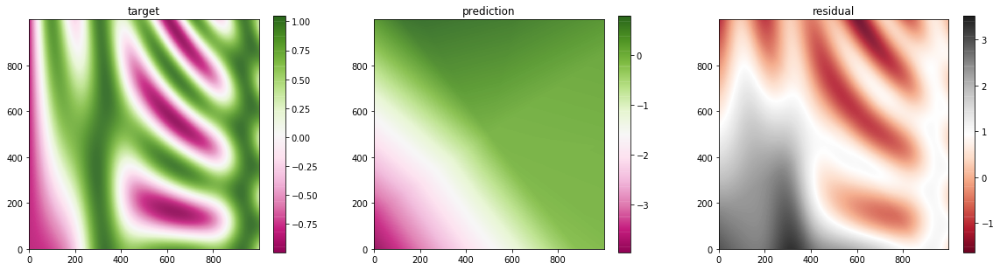

In [9]:
def plot_residuals(predict, params):
    x = np.linspace(-1, 1, 1000)
    y = np.linspace(-1, 1, 1000)

    X, Y = np.meshgrid(x, y)
    gridshape = X.shape
    data = np.vstack([X.ravel(),Y.ravel()])

    yHat = predict(params,data).reshape(gridshape)
    Z = f(X, Y) - yHat
    fig, (ax1, axYhat, ax2) = plt.subplots(1,3,figsize=(20,5))

    cbar1 = ax1.imshow(f(X, Y) , origin='lower',
            cmap='PiYG', alpha=0.9)
    # ax1.colorbar();
    ax1.set_title("target")
    fig.colorbar(cbar1, ax=ax1)

    cbarYhat = axYhat.imshow(yHat , origin='lower',
            cmap='PiYG', alpha=0.9)
    axYhat.set_title("prediction")
    fig.colorbar(cbarYhat, ax=axYhat)

    cbar2 = ax2.imshow(Z, origin='lower',
            cmap='RdGy', alpha=0.9)
    ax2.set_title("residual")
    fig.colorbar(cbar2, ax=ax2)
    plt.show()

plot_residuals(predict, params)

In [11]:
@jit
def loss(params, data):
    return np.sum(
        [(y - predict(params,x))**2 for x,y in data]
    )


@jit
def update(params, data, LR, ):
    grads = grad(loss)(params, data)
    return [
        (w - LR * normalize(dw), b - LR * normalize(db))
        for (w, b), (dw, db) in zip(params, grads)
    ]


In [12]:
def fit_model(
    LR_0 = .1,
    LR_min = .001,
    decay=.99,
    EPOCHS = 10,
    batches_per_epoch = 100,
    batch_size = 64,
    layers=[2,80,40,20,1],
    layer_initializer = init_network_params_He,
    params = None
):

    loss_list = []
    param_list = []
    if params is None:
        params = layer_initializer(layers)

    plot_residuals(predict, params)

    for i in range(EPOCHS*batches_per_epoch):
        X = 2*numpy.random.rand(2,batch_size)-1
        data = [
            (X[:,i:i+1], f(X[0,i],X[1,i]) )
            for i in range(batch_size)
        ]

        l = loss(params,data)
        loss_list.append(l)
        if np.isnan(l.item()):
            print("loss is nan")
            break

        LR = max(LR_0*decay**i, LR_min)

        params = update(params, data, LR)
        
        print(f"batch {i}, loss {l}, LR {LR}", end="\r")

        if i%batches_per_epoch==0:
            plot_residuals(predict, params)
            param_list.append(params)
        
    plot_residuals(predict, params)
        
    plt.plot(numpy.log10(loss_list))
    plt.show()
    return param_list, loss_list

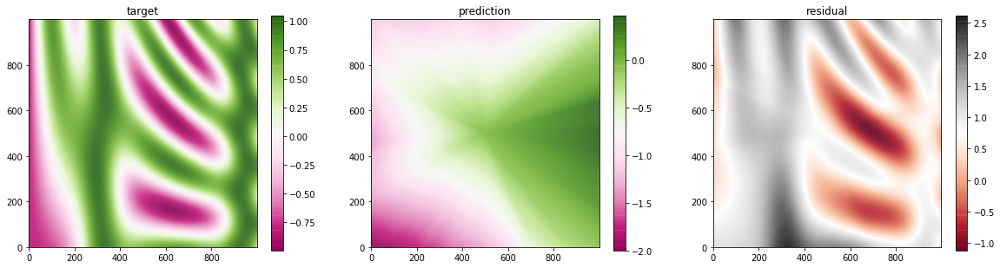

batch 0, loss 105.18521881103516, LR 0.1

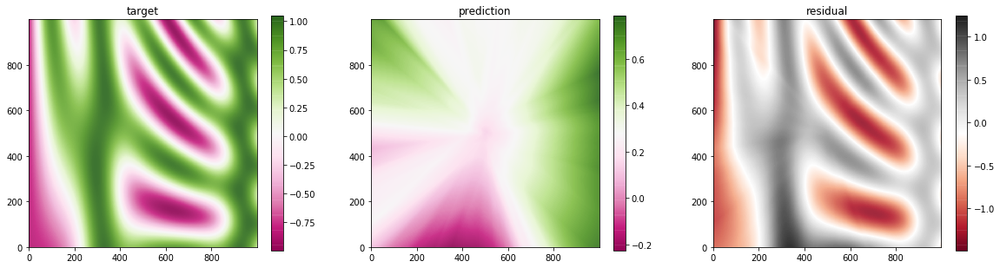

batch 100, loss 18.212139129638672, LR 0.03660323412732292

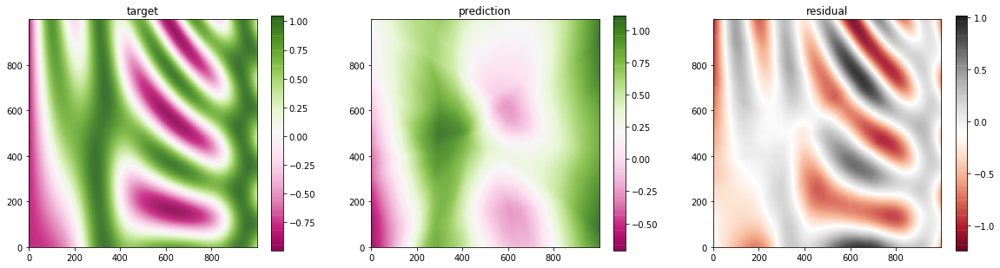

batch 200, loss 11.798355102539062, LR 0.013397967485796173

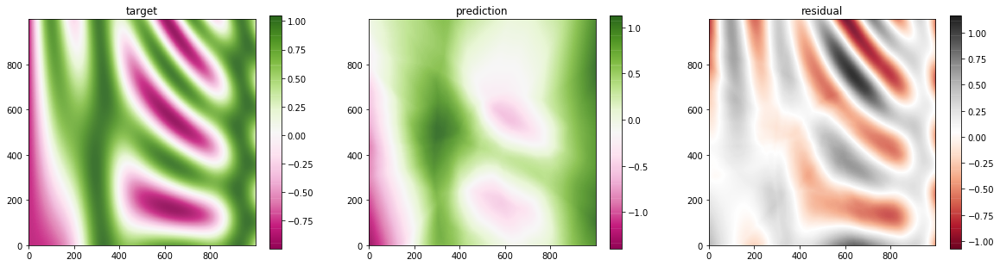

batch 300, loss 9.584022521972656, LR 0.0049040894071285725

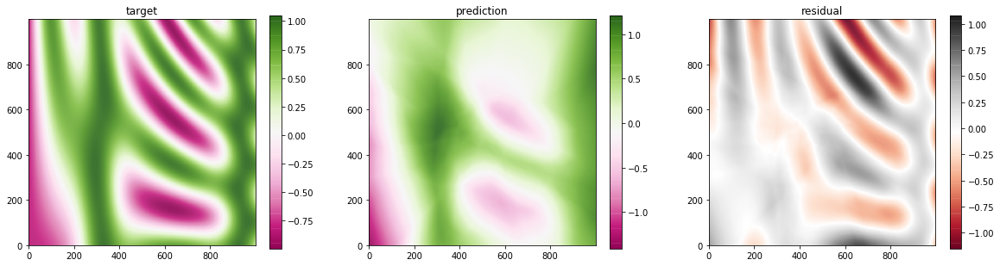

batch 400, loss 7.010782241821289, LR 0.0017950553275045138

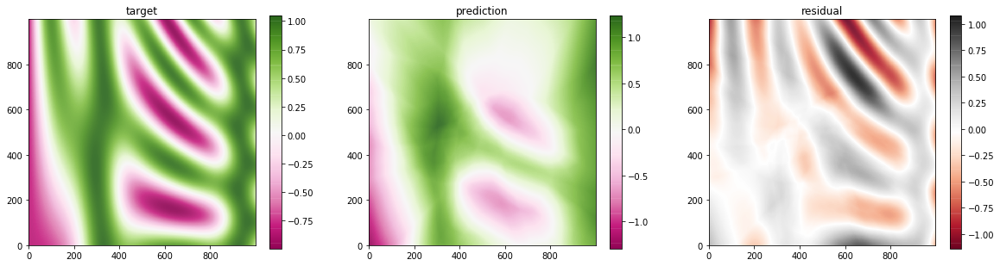

batch 500, loss 9.910798072814941, LR 0.001

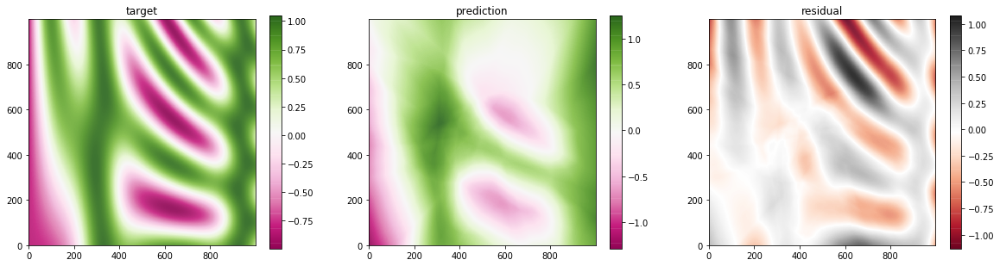

batch 600, loss 13.066272735595703, LR 0.001

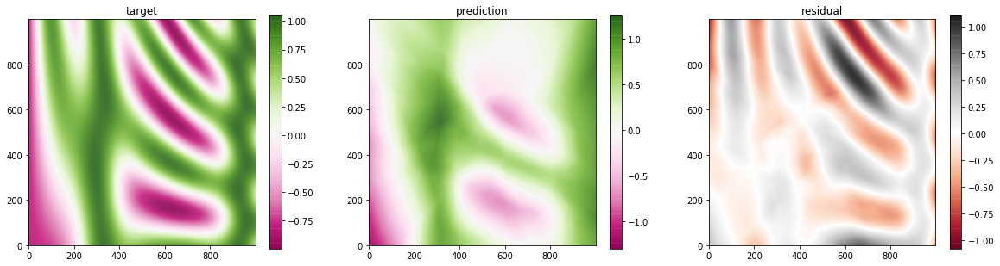

batch 699, loss 10.077610969543457, LR 0.001batch 700, loss 7.874381065368652, LR 0.001

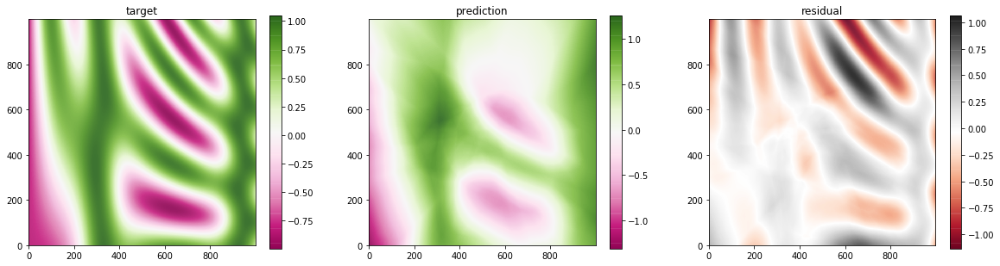

batch 800, loss 8.454572677612305, LR 0.001

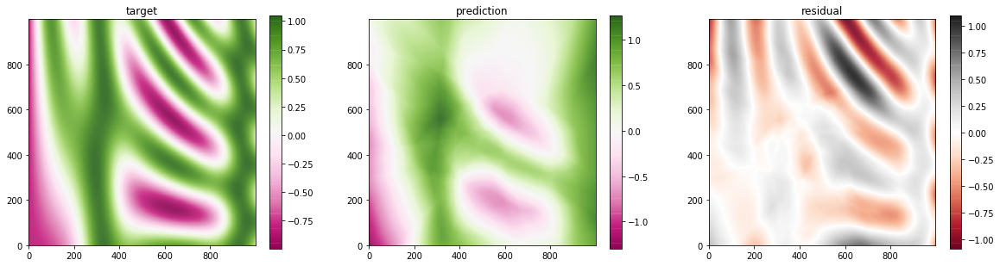

batch 900, loss 10.015929222106934, LR 0.001

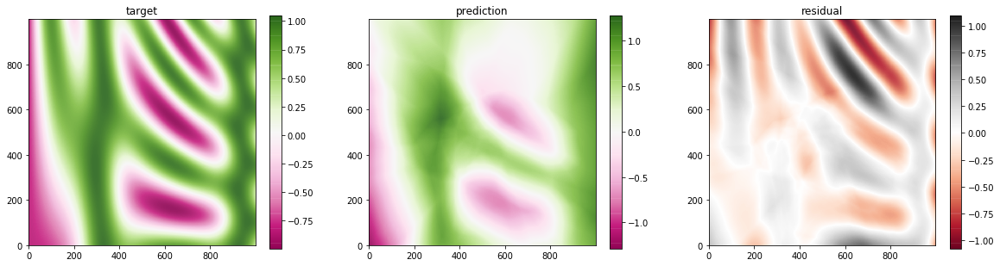

batch 998, loss 9.19739818572998, LR 0.001batch 999, loss 8.585853576660156, LR 0.001

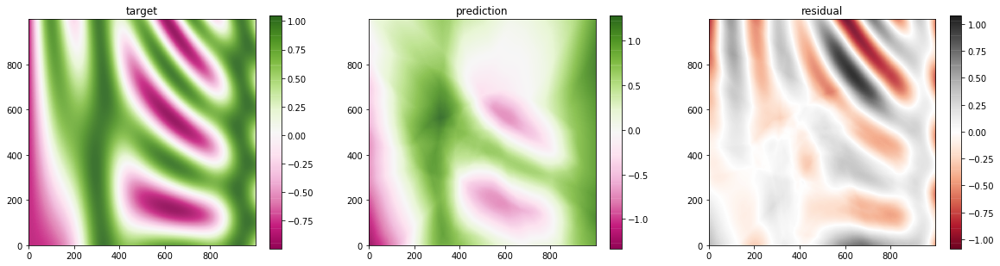

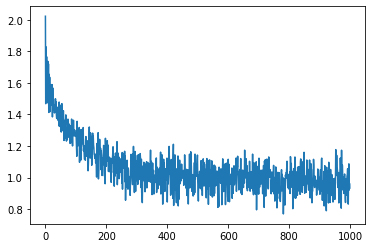

In [37]:
param_list, loss_list = fit_model(EPOCHS=10,batch_size=100)

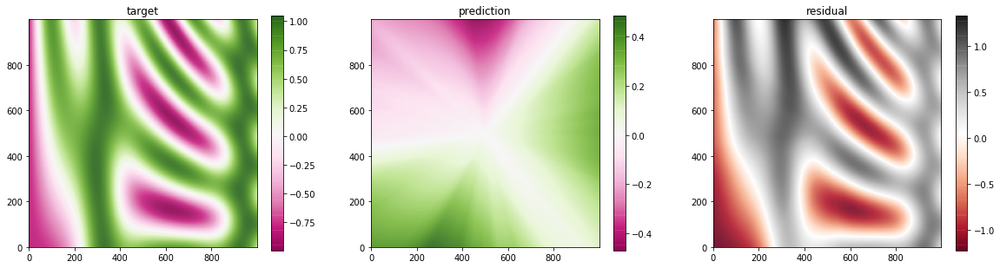

batch 0, loss 426.8755798339844, LR 0.1

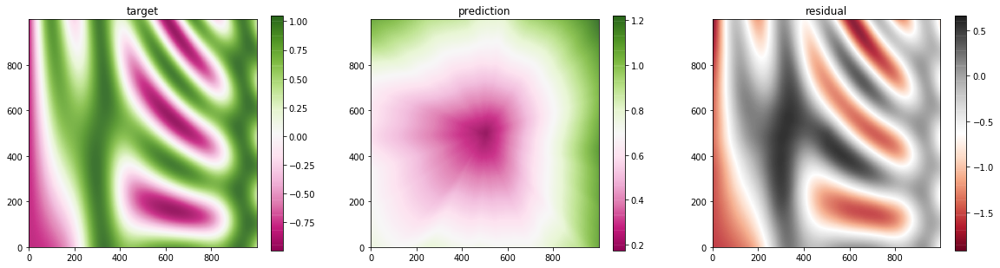

.001batch 533, loss 91.849853515625, LR 0.001batch 534, loss 87.81417846679688, LR 0.001batch 535, loss 88.3853530883789, LR 0.001batch 536, loss 81.398193359375, LR 0.001batch 537, loss 75.77432250976562, LR 0.001batch 538, loss 93.14271545410156, LR 0.001batch 539, loss 82.86402130126953, LR 0.001batch 540, loss 84.09357452392578, LR 0.001batch 541, loss 83.75133514404297, LR 0.001batch 542, loss 87.16768646240234, LR 0.001batch 543, loss 87.3065185546875, LR 0.001batch 544, loss 89.37611389160156, LR 0.001batch 545, loss 88.9621810913086, LR 0.001batch 546, loss 92.51815795898438, LR 0.001batch 547, loss 84.94896697998047, LR 0.001batch 548, loss 78.29901123046875, LR 0.001batch 549, loss 83.64817810058594, LR 0.001batch 550, loss 81.357421875, LR 0.001batch 551, loss 85.33512878417969, LR 0.001batch 552, loss 80.8349609375, LR 0.001batch 553, loss 83.6923828125, LR 0.001batch 554, loss 82.56405639648438, LR 0.001batch 555, loss 82.99871826171875, LR 0.001batch 556, loss 89.86377716

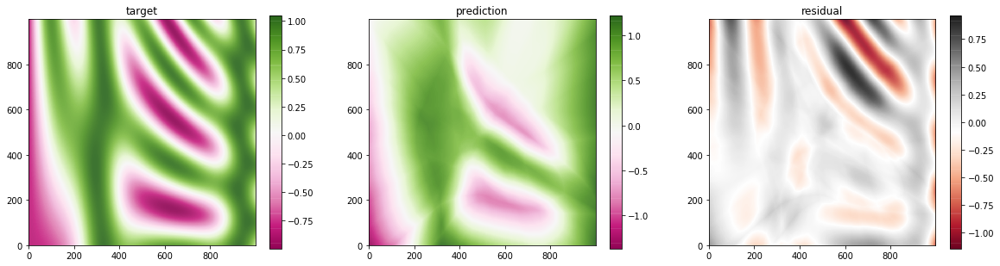

atch 1547, loss 75.69051361083984, LR 0.001batch 1548, loss 73.54329681396484, LR 0.001batch 1549, loss 64.63729095458984, LR 0.001batch 1550, loss 64.17048645019531, LR 0.001batch 1551, loss 60.90583038330078, LR 0.001batch 1552, loss 70.0438232421875, LR 0.001batch 1553, loss 66.8507080078125, LR 0.001batch 1554, loss 57.508033752441406, LR 0.001batch 1555, loss 68.29528045654297, LR 0.001batch 1556, loss 65.78848266601562, LR 0.001batch 1557, loss 61.74102020263672, LR 0.001batch 1558, loss 67.15763092041016, LR 0.001batch 1559, loss 72.22718811035156, LR 0.001batch 1560, loss 64.81433868408203, LR 0.001batch 1561, loss 62.79481887817383, LR 0.001batch 1562, loss 69.31743621826172, LR 0.001batch 1563, loss 74.51165008544922, LR 0.001batch 1564, loss 67.46967315673828, LR 0.001batch 1565, loss 71.8873291015625, LR 0.001batch 1566, loss 66.52680969238281, LR 0.001batch 1567, loss 56.510047912597656, LR 0.001batch 1568, loss 73.19764709472656, LR 0.001batch 1569, loss 64.88052368164062

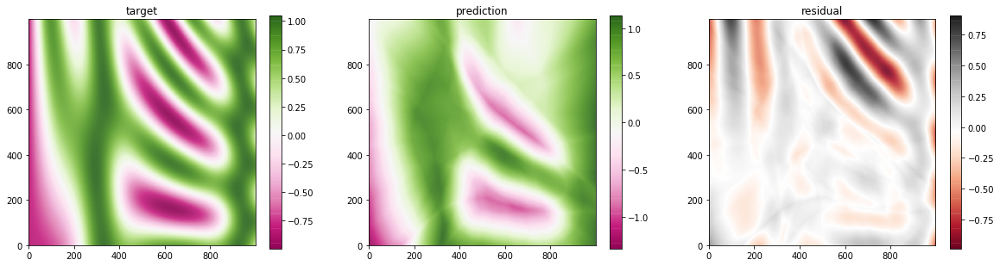

56.072776794433594, LR 0.001batch 2549, loss 48.55311965942383, LR 0.001batch 2550, loss 52.424072265625, LR 0.001batch 2551, loss 57.723934173583984, LR 0.001batch 2552, loss 56.905311584472656, LR 0.001batch 2553, loss 51.62222671508789, LR 0.001batch 2554, loss 62.656734466552734, LR 0.001batch 2555, loss 51.95351028442383, LR 0.001batch 2556, loss 52.394126892089844, LR 0.001batch 2557, loss 57.2509880065918, LR 0.001batch 2558, loss 57.8175048828125, LR 0.001batch 2559, loss 53.309539794921875, LR 0.001batch 2560, loss 47.85945129394531, LR 0.001batch 2561, loss 50.16051483154297, LR 0.001batch 2562, loss 56.56650924682617, LR 0.001batch 2563, loss 54.902793884277344, LR 0.001batch 2564, loss 53.776649475097656, LR 0.001batch 2565, loss 52.552005767822266, LR 0.001batch 2566, loss 53.43318176269531, LR 0.001batch 2567, loss 61.05643081665039, LR 0.001batch 2568, loss 56.85659408569336, LR 0.001batch 2569, loss 61.7424201965332, LR 0.001batch 2570, loss 59.41389083862305, LR 0.001b

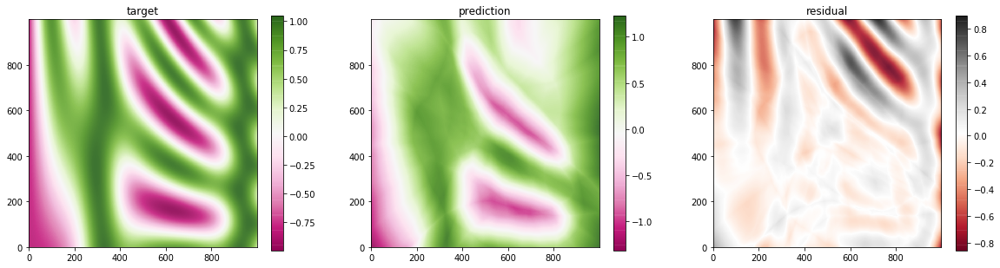

0.001batch 3549, loss 44.88648223876953, LR 0.001batch 3550, loss 49.62552261352539, LR 0.001batch 3551, loss 40.4014778137207, LR 0.001batch 3552, loss 49.86235809326172, LR 0.001batch 3553, loss 45.00426483154297, LR 0.001batch 3554, loss 40.40285110473633, LR 0.001batch 3555, loss 45.90342712402344, LR 0.001batch 3556, loss 45.783363342285156, LR 0.001batch 3557, loss 39.599525451660156, LR 0.001batch 3558, loss 44.33940505981445, LR 0.001batch 3559, loss 43.5281982421875, LR 0.001batch 3560, loss 44.18489074707031, LR 0.001batch 3561, loss 43.37488555908203, LR 0.001batch 3562, loss 41.30331802368164, LR 0.001batch 3563, loss 44.533531188964844, LR 0.001batch 3564, loss 39.77099609375, LR 0.001batch 3565, loss 39.738826751708984, LR 0.001batch 3566, loss 40.18778991699219, LR 0.001batch 3567, loss 44.92385482788086, LR 0.001batch 3568, loss 43.668270111083984, LR 0.001batch 3569, loss 41.170738220214844, LR 0.001batch 3570, loss 40.53658676147461, LR 0.001batch 3571, loss 45.174392

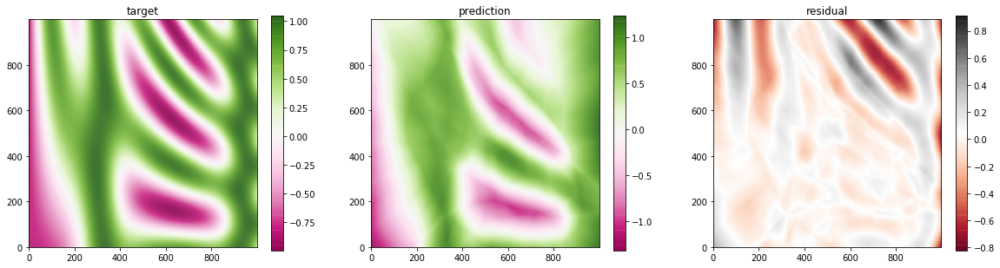

47656, LR 0.001batch 4550, loss 34.710105895996094, LR 0.001batch 4551, loss 38.524173736572266, LR 0.001batch 4552, loss 33.390869140625, LR 0.001batch 4553, loss 32.31758117675781, LR 0.001batch 4554, loss 31.0675048828125, LR 0.001batch 4555, loss 32.67864227294922, LR 0.001batch 4556, loss 34.98630142211914, LR 0.001batch 4557, loss 40.17076110839844, LR 0.001batch 4558, loss 31.596755981445312, LR 0.001batch 4559, loss 35.11351013183594, LR 0.001batch 4560, loss 32.585323333740234, LR 0.001batch 4561, loss 37.524993896484375, LR 0.001batch 4562, loss 35.29043960571289, LR 0.001batch 4563, loss 37.07710266113281, LR 0.001batch 4564, loss 36.95440673828125, LR 0.001batch 4565, loss 36.90766525268555, LR 0.001batch 4566, loss 35.87999725341797, LR 0.001batch 4567, loss 34.92237854003906, LR 0.001batch 4568, loss 30.251646041870117, LR 0.001batch 4569, loss 32.87892150878906, LR 0.001batch 4570, loss 34.63482666015625, LR 0.001batch 4571, loss 35.519622802734375, LR 0.001batch 4572, l

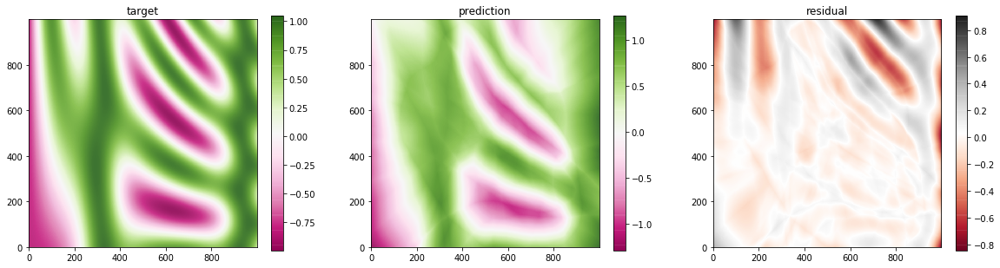

23.368850708007812, LR 0.001batch 5553, loss 24.990863800048828, LR 0.001batch 5554, loss 24.632572174072266, LR 0.001batch 5555, loss 26.37247085571289, LR 0.001batch 5556, loss 26.953508377075195, LR 0.001batch 5557, loss 26.610837936401367, LR 0.001batch 5558, loss 26.483505249023438, LR 0.001batch 5559, loss 27.1234130859375, LR 0.001batch 5560, loss 23.311786651611328, LR 0.001batch 5561, loss 28.178712844848633, LR 0.001batch 5562, loss 27.11480712890625, LR 0.001batch 5563, loss 28.094886779785156, LR 0.001batch 5564, loss 27.068830490112305, LR 0.001batch 5565, loss 25.501741409301758, LR 0.001batch 5566, loss 27.3155460357666, LR 0.001batch 5567, loss 25.065950393676758, LR 0.001batch 5568, loss 24.541654586791992, LR 0.001batch 5569, loss 28.586471557617188, LR 0.001batch 5570, loss 25.528736114501953, LR 0.001batch 5571, loss 24.28097915649414, LR 0.001batch 5572, loss 27.374515533447266, LR 0.001batch 5573, loss 27.194650650024414, LR 0.001batch 5574, loss 26.84148406982422

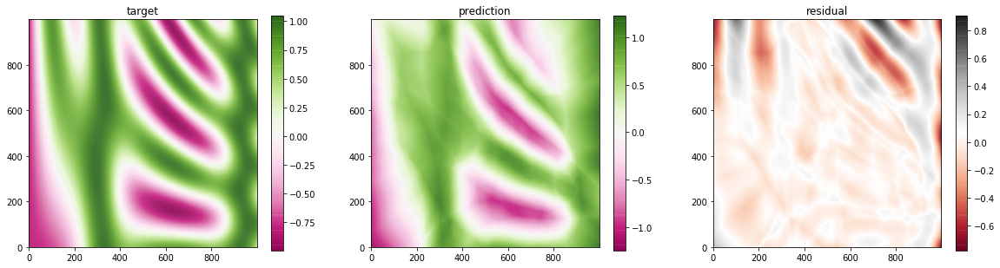

44, LR 0.001batch 6390, loss 20.357776641845703, LR 0.001batch 6391, loss 23.093738555908203, LR 0.001batch 6392, loss 22.040542602539062, LR 0.001batch 6393, loss 25.66452980041504, LR 0.001batch 6394, loss 24.269758224487305, LR 0.001batch 6395, loss 23.588489532470703, LR 0.001batch 6396, loss 21.256338119506836, LR 0.001batch 6397, loss 22.988346099853516, LR 0.001batch 6398, loss 22.217729568481445, LR 0.001batch 6399, loss 23.82404136657715, LR 0.001batch 6400, loss 23.810588836669922, LR 0.001batch 6401, loss 20.377504348754883, LR 0.001batch 6402, loss 26.12984275817871, LR 0.001batch 6403, loss 20.855892181396484, LR 0.001batch 6404, loss 20.083017349243164, LR 0.001batch 6405, loss 26.45915985107422, LR 0.001batch 6406, loss 22.321353912353516, LR 0.001batch 6407, loss 22.338579177856445, LR 0.001batch 6408, loss 19.629375457763672, LR 0.001batch 6409, loss 22.488422393798828, LR 0.001batch 6410, loss 22.00230598449707, LR 0.001batch 6411, loss 20.794702529907227, LR 0.001bat

KeyboardInterrupt: 

In [47]:
param_list, loss_list = fit_model(layers =[2,180,40,20,1], EPOCHS=20, batches_per_epoch=1000, batch_size=1000)

In [48]:
param_list

              [-0.15214132],
                [-0.05552116],
                [ 0.04936573],
                [ 0.18912248],
                [-0.24028185],
                [-0.05539081],
                [ 0.22369148],
                [ 0.00160962],
                [ 0.        ],
                [-0.12040351],
                [-0.3514318 ],
                [ 0.        ],
                [-0.05806702],
                [-0.32799017],
                [-0.10826227],
                [ 0.2853848 ],
                [ 0.00063766]], dtype=float32)),
  (DeviceArray([[ 9.36377272e-02, -3.81593443e-02, -5.14259823e-02,
                  1.44618466e-01,  7.98707381e-02, -4.29026708e-02,
                  2.26594345e-03,  3.12659740e-01, -1.31257966e-01,
                 -1.83749795e-01, -4.97144349e-02, -1.01428561e-01,
                  1.13892645e-01, -3.68547030e-02, -2.21895725e-01,
                 -3.42689097e-01, -2.63064150e-02, -3.39357585e-01,
                 -8.19863677e-02,  1.09830491e-01

# Modified He

In [12]:
def init_network_params_He_modified(sizes):
    return [(
        numpy.random.randn(n, m)*numpy.sqrt(2/m),
        # numpy.linspace(-.3,-1,n).reshape(-1,1)
        numpy.random.randn(n,1)
        # numpy.random.randn(n, 1)*numpy.sqrt(2/m)
    ) for m, n in zip(sizes[:-1], sizes[1:])]

# def init_network_params_spiral(sizes):
#     return [(
#         numpy.random.randn(n, m)*numpy.sqrt(2/m),
#         numpy.linspace(-1,-2,n).reshape(-1,1)
#         # numpy.random.randn(n,1)
#         # numpy.random.randn(n, 1)*numpy.sqrt(2/m)
#     )

In [20]:
def num_params(layers):
    n=0
    for w,b in layers:
        n += w.size + b.size
    return n 

num_params(params)

151

61


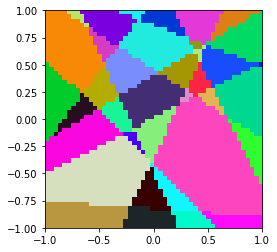

59


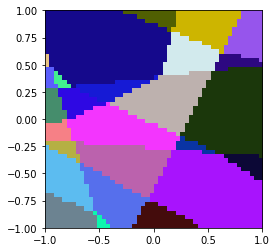

57


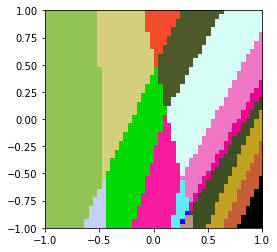

63


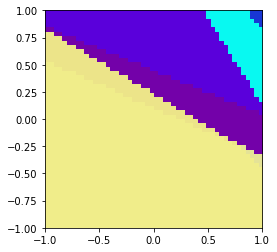

In [35]:
params = init_network_params_He_modified([2,15,1])
print(num_params(params))
plot_surface_grad_domains_on_grid(predict,params,50)
plt.show()

params = init_network_params_He_modified([2,6,5,1])
print(num_params(params))
plot_surface_grad_domains_on_grid(predict,params,50)
plt.show()

params = init_network_params_He_modified([2,4,4,4,1])
print(num_params(params))
plot_surface_grad_domains_on_grid(predict,params,50)
plt.show()

params = init_network_params_He_modified([2,4,4,3,3,1])
print(num_params(params))
plot_surface_grad_domains_on_grid(predict,params,50)
plt.show()

4321


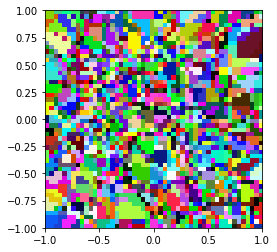

In [38]:
params = init_network_params_He_modified([2,80,40,20,1])
print(num_params(params))
plot_surface_grad_domains_on_grid(predict,params,50)
plt.show()

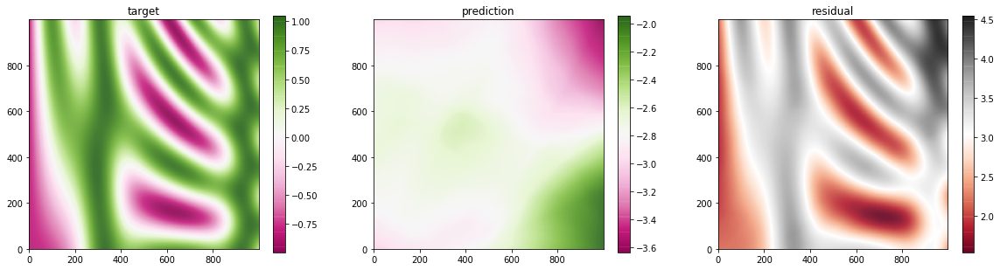

batch 0, loss 943.6136474609375, LR 0.1

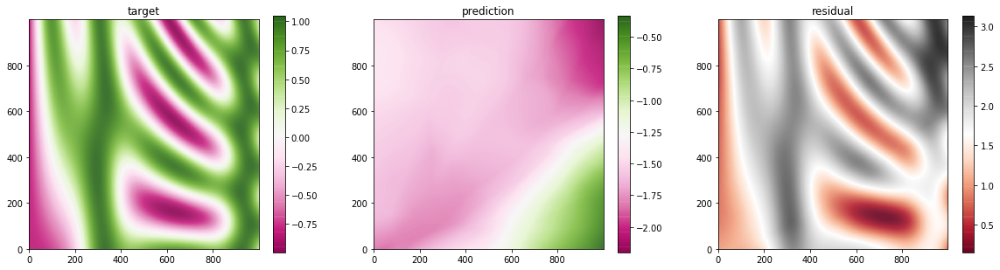

batch 99, loss 30.77546501159668, LR 0.036972963764972645batch 100, loss 26.172176361083984, LR 0.03660323412732292

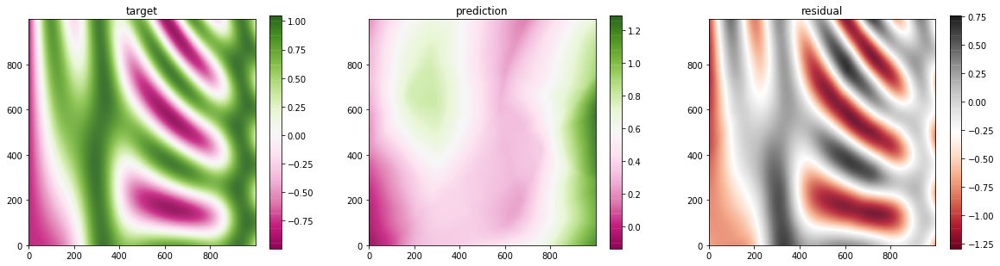

batch 200, loss 18.183860778808594, LR 0.013397967485796173

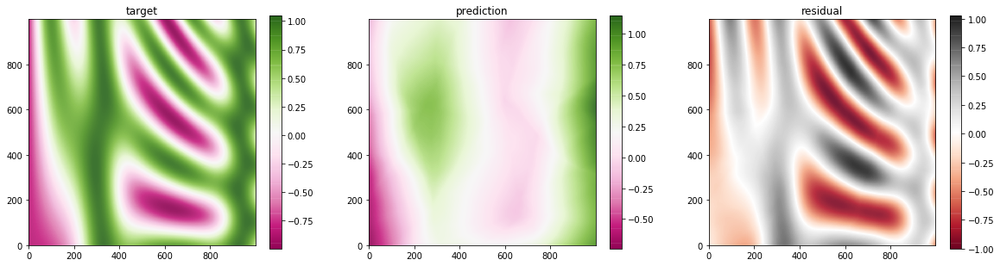

batch 300, loss 15.344987869262695, LR 0.0049040894071285725

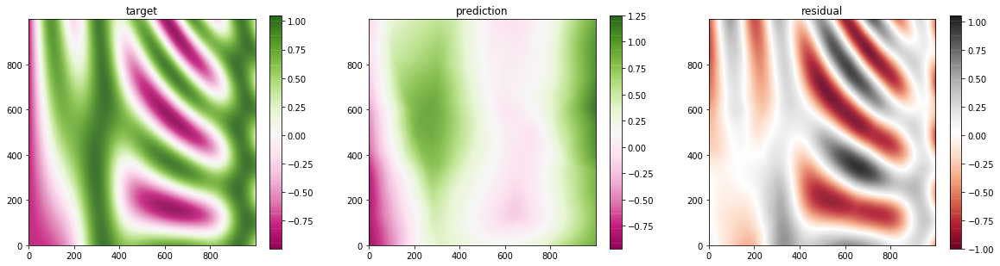

batch 400, loss 17.763723373413086, LR 0.0017950553275045138

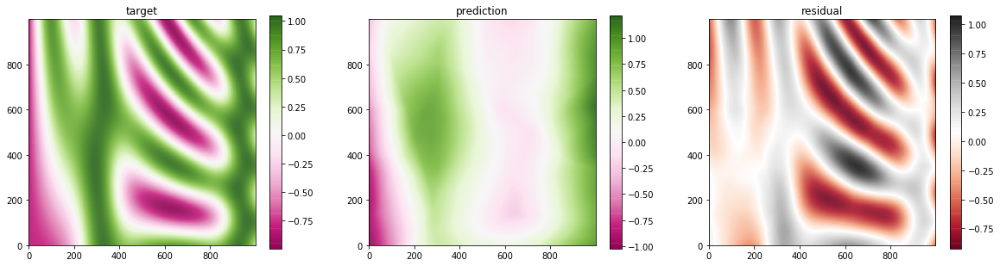

batch 500, loss 14.040741920471191, LR 0.001

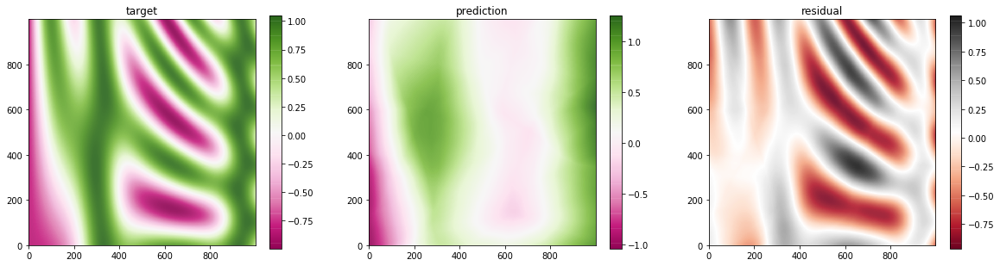

batch 600, loss 18.884532928466797, LR 0.001

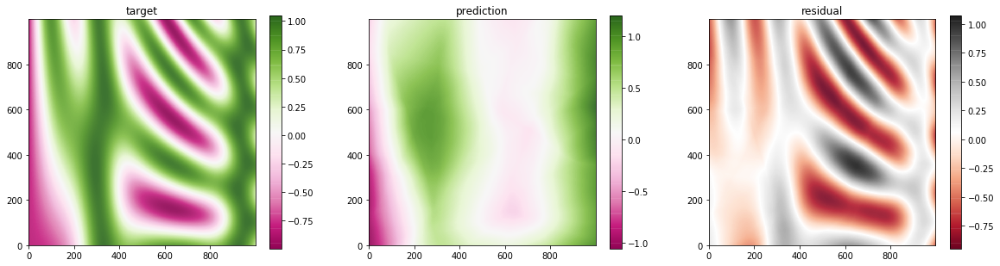

batch 700, loss 16.416114807128906, LR 0.001

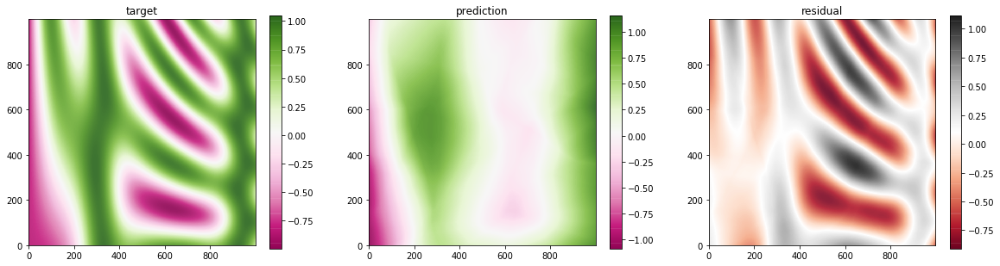

batch 799, loss 18.67887306213379, LR 0.001batch 800, loss 15.707085609436035, LR 0.001

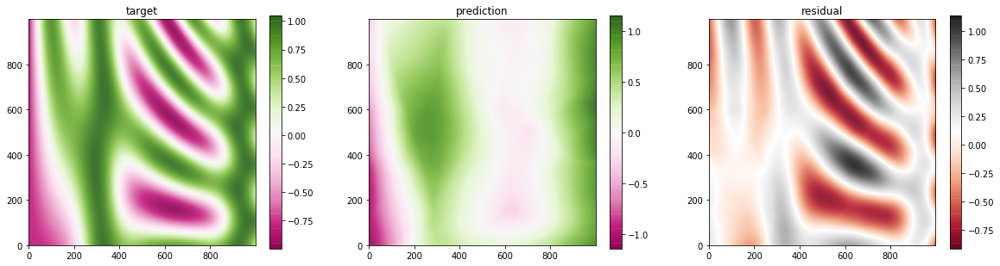

batch 900, loss 13.915340423583984, LR 0.001

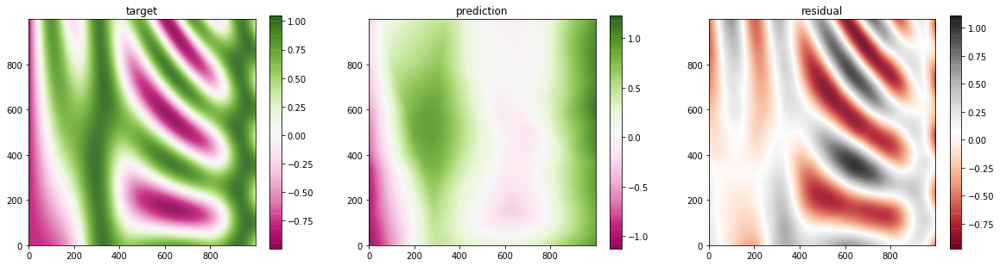

batch 999, loss 17.675142288208008, LR 0.001

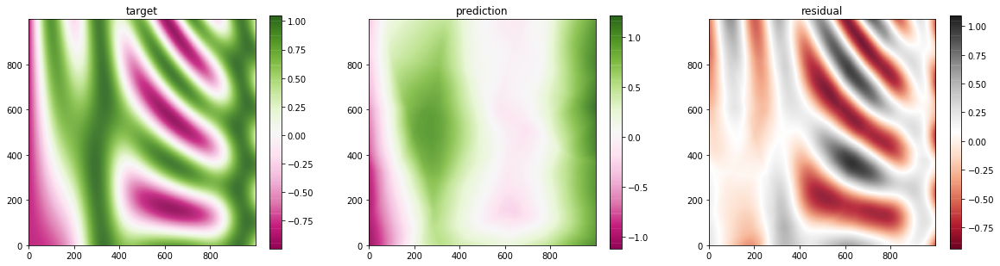

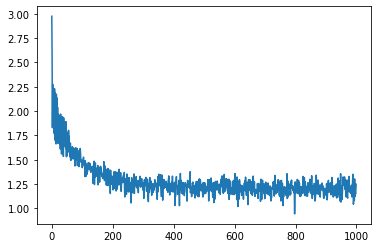

(15.132442, dtype=float32),
  DeviceArray(15.64075, dtype=float32),
  DeviceArray(19.681814, dtype=float32),
  DeviceArray(15.211918, dtype=float32),
  DeviceArray(18.783936, dtype=float32),
  DeviceArray(11.899896, dtype=float32),
  DeviceArray(16.603735, dtype=float32),
  DeviceArray(19.703001, dtype=float32),
  DeviceArray(18.210087, dtype=float32),
  DeviceArray(16.191225, dtype=float32),
  DeviceArray(15.178454, dtype=float32),
  DeviceArray(16.357716, dtype=float32),
  DeviceArray(16.815977, dtype=float32),
  DeviceArray(20.47814, dtype=float32),
  DeviceArray(15.097306, dtype=float32),
  DeviceArray(14.930344, dtype=float32),
  DeviceArray(14.86373, dtype=float32),
  DeviceArray(16.246702, dtype=float32),
  DeviceArray(12.984698, dtype=float32),
  DeviceArray(13.78759, dtype=float32),
  DeviceArray(18.375835, dtype=float32),
  DeviceArray(14.152815, dtype=float32),
  DeviceArray(11.42742, dtype=float32),
  DeviceArray(16.776703, dtype=float32),
  DeviceArray(18.320072, dtype=flo

In [39]:
param_list, loss_list = fit_model(layer_initializer=init_network_params_He_modified,EPOCHS=10, batch_size=100)

8621
